# Учебный проект: Исследование рынка общественного питания в Москве

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. 
В данной работе мы проведем исследование рынка Москвы, найдем интересные особенности и презентуем полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

В нашем распоряжении имеется датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

**Описание данных**

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона:
  - «Средний счёт: 1000–1500 ₽»
  - «Цена чашки капучино: 130–220 ₽» 
  - «Цена бокала пива: 400–600 ₽» и так далее);
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений
 
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число
 
  - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт;

- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений
  
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число

  - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт;
  
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

  - 0 — заведение не является сетевым

  - 1 — заведение является сетевым;
  
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

### Шаг 1. Загрузка библиотек и изучение общей информации

In [1]:
#импортируем библиотеки
import pandas as pd
from datetime import datetime, timedelta
import datetime as dt
from matplotlib import pyplot as plt
import numpy as np
import matplotlib.dates as mdates
import scipy.stats as stats
import seaborn as sns
import math as mth
from scipy import stats as st
import plotly.express as px
from plotly import graph_objects as go
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster
import folium

Прочитаем CSV-файл с данными с помощью библиотеки pandas и сохраним его в датафрейм data

In [2]:
#прочитаем датасет и сохраним его в переменную data
try:
    data = pd.read_csv('moscow_places.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv')

Для качественной предобработки данных создадим универсальную функцию, которая будет на вход принимать датафрейм, а на выходе будет выводить все необходимые характеристики, поочередно применяя методы head, info, duplicated и isna.

In [3]:
#пропишем функцию
def information(df):
    display(df.head())
    df.info()
    display(df.isna().sum())
    display(df.duplicated().value_counts())

In [4]:
#применим функцию к датафрейму data
information(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

False    8406
Name: count, dtype: int64

Универсальная функция показала, что всего заведений в датасете 8406, а так же какой тип хранят столбцы. 
Явных дубликатов в данных нет, но есть достаточное количество пропусков, с ними разберемся в следующем шаге.

___

На этапе **первого шага** были сделано следующее:
- выгружены все нужные для дальнейшей работы библиотеки;
- прочитан csv-файла и сохранен в датафрем data;
- выяснили, что нет явных дубликатов и вывели типы данных каждого столбца;
- определили количество пропусков в каждом столбце датафрейма.


### Шаг 2.  Предобработка данных

в Шаге 1 мы увидели, что нет явных дубликатов, теперь проверим, есть ли неявные дубликаты в данных, для этого выведим на экран количество строк, в которых есть совпадения в названии заведения и адресе.
Но для начала приведем адрес и названия заведений к нижнему регистру.

In [5]:
#переведем к нижнему регистру колонки name и address
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()

In [6]:
#посчитаем количество неявных дубликатов
data.duplicated(subset = ['name', 'address']).sum()

4

Итак, количество неявных дуюликатов равно четырем, удалим эти строки и перепроверим наше удаление.

In [7]:
#удалим неявные дубликаты с помощью метода drop_duplicates()
data = data.drop_duplicates(subset = ['name', 'address'])
data.duplicated(subset = ['name', 'address']).sum()

0

Как мы можем заметить, неявных дуюликатов нет.

Предыдущий шаг показал, что в датасете очень много пропусков, разберемся с каждым столбцом по отдельности. 

**Стобец 'hours'** имеет 536 пустых строк, точное время работы заведения заполнить вручную будет очень сложно, поэтому оставим данные незаполненными. 

В **Стобце 'price'** хранятся категории цен, но они могут быть разные для конкретных категорий заведений, поэтому заполнить их так же проблематично.

**Стобцы 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup' и 'seats'** так же трудны в заполнении, поэтому оставим все как есть. 


Создадим новый **столбец 'street'** с названиями улиц из столбца с адресом:

In [8]:
#извлечем название улиц с помощью split и strip
data['street'] = data['address'].str.split(',').str[1].str.strip()

Создадим новый **столбец 'is_24/7'** с обозначением, что заведение работает ежедневно и круглосуточно (24/7) или нет.

Для этого пропишем функцию и заменим NaN на пустое значение в строке:

In [9]:
#заменим NaN на пустое значение в строке
data['hours'] = data['hours'].fillna('')

Пропишем функцию def daily(hours), которая заполнит новый столбец 'is_24/7' следующими значениями:
- 'ежедневно и круглосуточно' - если заведение работает без выходных
- 'другое' - если заведение имеет иной график, например "ежедневно, 10:00–22:00" или "пн-чт 11:00–02:00" и т.д.

In [10]:
#пропишем функцию, которая будет определять, работает заведение ежедневно и круглосуточно или нет
def daily(hours):
    if 'ежедневно' in hours and 'круглосуточно' in hours:
        return 'ежедневно и круглосуточно'
    else:
        return 'другое'
#создадим столбец 'is_24/7'
data['is_24/7'] = data['hours'].apply(daily)

#выведем датафрем на экран и посмотрим на новые столбцы
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,другое
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,другое
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,другое
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,другое
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,другое


____

Во **втором шаге** была проведена предобработка данных, вот, что мы сделали и выявили: 
- убедились, что нет явных дубликатов и удалили неявные дубликаты в развере 4-х строк;
- приняли решение оставить пропуски в данных;
- создали два новых столбца 'street' с названием улиц и 'is_24/7' с графиком работы заведений.


### Шаг 3.  Анализ данных

#### 3.1  Категории заведений

Проанализируем, какие категории заведений представлены в данных, а так же займемся исследованием количества объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. 


In [11]:
#посчитаем количества заведений в каждой категории
count_category = data['category'].value_counts().reset_index()

#переименуем столбцы для удобства
count_category.columns = ['category', 'count_name']

#выведим на экран таблицу
count_category

,category,count_name
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


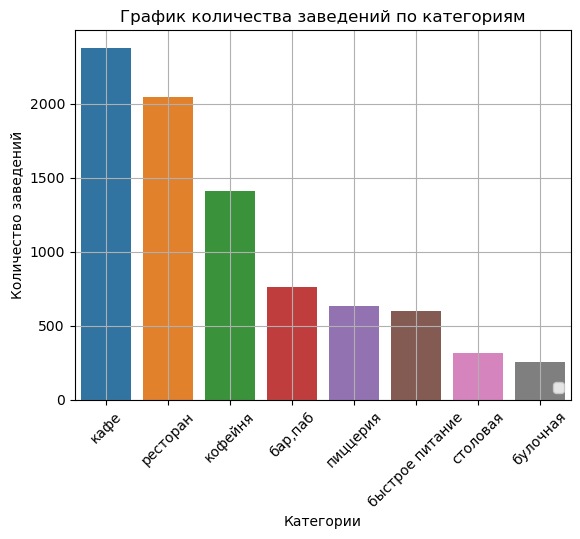

In [12]:
#построим график на основании таблицы выше
flights = sns.load_dataset('flights')
ax = sns.barplot(x=count_category['category'], y=count_category['count_name'], data=flights)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График количества заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество заведений')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()


Заведения распределены по категорям неравномерно, мы видим, что в топе графика находится категория "кафе", у которой 2378 заведений, далее идут "рестораны" и "кофейни" (2043 и 1413 заведений).  

#### 3.2  Посадочные места

Проанализируем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. 
Для этого сгруппируем данные по категориям заведений и посчитаем медиану количества посадочных мест, берем медиану, так как у нас есть пропуски в данных, которые мы не заполнили.

In [13]:
#сгруппируем данные по категориям и посчитаем медиану посадочных мест
count_seats = data.groupby('category')['seats'].mean().reset_index()

#переименуем столбцы для удобства
count_seats.columns = ['category', 'seats_count']

#округлим значения в большую сторону
count_seats['seats_count'] = np.ceil(count_seats['seats_count'])


#добавим фильтр значений по убыванию
count_seats = count_seats.sort_values(by='seats_count', ascending=False)

#выведем результаты на экран
count_seats


,category,seats_count
0,"бар,паб",125.0
6,ресторан,122.0
4,кофейня,112.0
7,столовая,100.0
2,быстрое питание,99.0
3,кафе,98.0
5,пиццерия,95.0
1,булочная,90.0


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


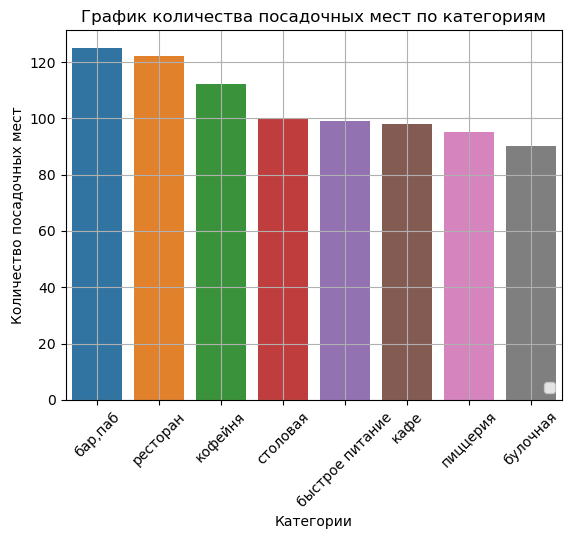

In [14]:
#построим график
flights = sns.load_dataset('flights')
ax = sns.barplot(x=count_seats['category'], y=count_seats['seats_count'], data=flights)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График количества посадочных мест по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество посадочных мест')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Больше всего посадочных мест в барах и пабах, в среднем 125 посадочных мест, далее идут рестораны - 122 мест и кофейни - 112 мест.

#### 3.3  Соотношение сетевых и несетевых заведений 

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. 
Для этого построим круговую диаграмму, где
- 0 — заведение не является сетевым
- 1 — заведение является сетевым

In [15]:
#сгруппируем данные по сетевому статусу и посчитаем количество заведений
group_chain = data['chain'].value_counts().reset_index(name='count_chain')

#построим круговую диаграмму
fig = go.Figure(data=[go.Pie(labels=group_chain['count_chain'], values=group_chain['count_chain'])])
fig.update_layout(title=' Соотношение сетевых и несетевых заведений ')
fig.show()

Итак, мы видим, что несетвые заведения лидируют, их больше, чем сетевых заведений на 23.8%: 
- сетевые заведения 38.1%
- несетевын заведения 61.9%.

#### 3.4  Сетевые заведения

Посмотрим, какие категории заведений чаще являются сетевыми в процентном соотношении. Для этого сгруппируем данные по категориям заведений и принадлежности к сетевым заведениям и построим график.

In [16]:
#создадим таблицу с сетевыми заведениями, где chain = 1
filter_chain = data[data['chain'] == 1]

#сгруппируем данные по категориям и посчитаем количество сетевых заведений
filter_category = filter_chain.groupby('category')['name'].count().reset_index()

#переименуем столбцы для удобства
filter_category.columns = ['category', 'name_count']

#добавим фильтр значений по убыванию
filter_category = filter_category.sort_values(by='name_count', ascending=False)

#выведем таблицу на экран
filter_category


,category,name_count
3,кафе,779
6,ресторан,729
4,кофейня,720
5,пиццерия,330
2,быстрое питание,232
0,"бар,паб",168
1,булочная,157
7,столовая,88


Присоединим данные по количеству заведений в каждой категории и посчитаем процентноее соотношение сетевых заведений.

In [17]:
#присоединим данные по количеству заведений к таблице выше с помощью метода merge()
filter_category = count_category.merge(filter_category, how='left', on='category').reset_index()

#создадим новый столбец percent и посчитаем процентное соотношение
filter_category['percent'] = round(filter_category['name_count']/filter_category['count_name']*100, 2)

#отфильтруем данные по убыванию процентов
filter_category = filter_category.sort_values(by='percent', ascending=False)

#выведим таблицу на экран
filter_category

,index,category,count_name,name_count,percent
7,7,булочная,256,157,61.33
4,4,пиццерия,633,330,52.13
2,2,кофейня,1413,720,50.96
5,5,быстрое питание,603,232,38.47
1,1,ресторан,2042,729,35.70
0,0,кафе,2376,779,32.79
6,6,столовая,315,88,27.94
3,3,"бар,паб",764,168,21.99


Отобразим процентное соотношение сетевых заведений на графике:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


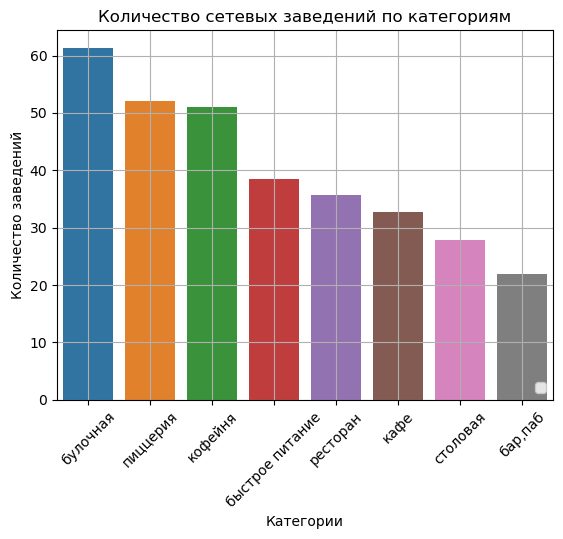

In [18]:
#построим график
flights = sns.load_dataset('flights')
ax = sns.barplot(x=filter_category['category'], y=filter_category['percent'], data=flights)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество сетевых заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество заведений')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Итак, график показал, что самое большое процентное соотношение сетевых заведений у категории "булочная" - 61.33%, очень большой показатель, но это действительно так, например, булочная "Буханка", кажется, находится чуть ли ни в каждом районе.

Далее идут категории "пиццерия" - 52.13% и "кофейни" - 50.96%. 

#### 3.5  Самые популярные сетевые заведения

Теперь найдем топ-15 популярных сетей в Москве. Для этого сгруппируем данные по названию заведений и посчитаем их количество.

In [19]:
#сгруппируем данные по названию и категориям заведений
group_data_chain = filter_chain.groupby(['name', 'category'])

#посчитаем количество заведений в каждой группе
group_data_chain = group_data_chain.size().reset_index()

#переименуем столбцы для удобства
group_data_chain.columns = ['name', 'category', 'chain_count']


#отсортируем данные по убыванию количества заведений
group_data_chain = group_data_chain.sort_values(by='chain_count', ascending=False)

#выведем топ 15 заведений на экран
group_data_chain = group_data_chain.head(15)
group_data_chain


,name,category,chain_count
1126,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1142,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
617,кофепорт,кофейня,42
632,кулинарная лавка братьев караваевых,кафе,39
963,теремок,ресторан,36


Теперь построим график для наглядности: 

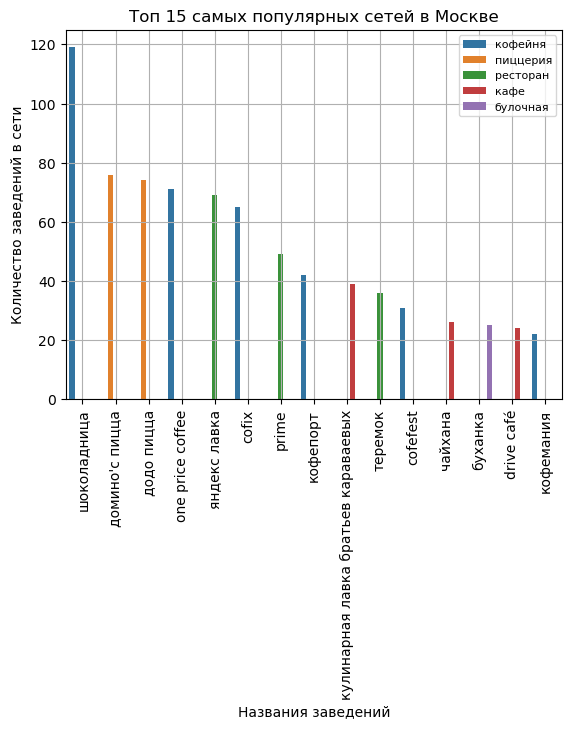

In [20]:
#построим график
flights = sns.load_dataset('flights')
ax = sns.barplot(x=group_data_chain['name'], y=group_data_chain['chain_count'], hue=group_data_chain['category'], data=flights)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Топ 15 самых популярных сетей в Москве')
plt.xlabel('Названия заведений')
plt.ylabel('Количество заведений в сети')
# поворачиваем подписи значений по оси X на 90 градусов
plt.xticks(rotation=90)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=8)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

По графику видно, что в **топе три заведения:** 
- **кофейня Шоколадница** - 119 заведений
- **пиццерия Домино'с Пицца** - 76 заведений
- **пиццерия Додо Пицца** - 74 заведения

Можно заметить, что эти заведения, которые нахродятся в топ-15, действителньно самые популярные в столице, так как их можно встретить буквально в каждом районе Москвы, и с ними знаком, думаю, каждый житель мегаполиса, а еще у них есть объединящий признак - они все работают по франшизе, возможно, поэтому их так много.

#### 3.6  Административные районы Москвы

Посмотрим, какие административные районы Москвы присутствуют в нашем датасете и отобразим общее количество заведений и количество заведений каждой категории по районам. 

Для этого сначала создадим сгруппированную таблицу по административному району и категории и посчитаем количество заведений в каждой категории по районам.

И создадим таблицу с общим количеством заведений в каждом районе.

In [21]:
#создадим таблицу с группировкой по категориям data_district
data_district = data.groupby(['district', 'category']).size().reset_index(name='count_category')

#выведим ее на экран 
data_district.head()

,district,category,count_category
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105


In [22]:
#создадим таблицу с группировкой только по районам data_district_total
data_district_total = data.groupby('district').size().reset_index(name='total_district')

#выведим ее на экран 
data_district_total

,district,total_district
0,Восточный административный округ,798
1,Западный административный округ,850
2,Северный административный округ,898
3,Северо-Восточный административный округ,890
4,Северо-Западный административный округ,409
5,Центральный административный округ,2242
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Южный административный округ,892


Мы видим, что в датасете присутствуют 9 из 12 основных административных округов Москвы:
- Восточный административный округ
- Западный административный округ	
- Северный административный округ
- Северо-Восточный административный округ	
- Северо-Западный административный округ	
- Центральный административный округ	
- Юго-Восточный административный округ	
- Юго-Западный административный округ	
- Южный административный округ	

Теперь отобразим полученные данные на графике: 

In [23]:
# Создание графика
fig = px.bar(data_district, # загружаем данные
             x='district', # указываем столбец с данными для оси X
             y='count_category', # указываем столбец с данными для оси y
             color='category')  # обозначаем категорию для разделения цветом
fig.update_layout(title='Количество заведений каждой категории по административным округам Москвы',
                  xaxis_title='Административный округ',
                  yaxis_title='Количество заведений',
                  height=700, # устанавливим высоту графика 
                  width=900, # устанавливим ширину графика 
                  xaxis={'categoryorder': 'total descending'}) # отсортируем данные по убыванию

fig.show()

Центральный административный округ лидирует, самая популярная категория заведений в данном округе - это рестораны - 670 заведений, далее идут кафе - 464 заведений и кофейни - 428 заведений.

Второе и третье место заняли Северный административный округ и Южный административный округ.

#### 3.7 Распределение средних рейтингов по категориям заведений

Визуализируем распределение средних рейтингов по категориям заведений и проанализируем, как различаются усреднённые рейтинги в разных типах общепита.

In [24]:
#сгруппируем данные по категориям и посчитаем средний рейтинг
avg_ratings = data.groupby('category')['rating'].mean().reset_index()

#переименуем столбцы для удобства
avg_ratings.columns = ['category', 'rating_mean']

#отсортируем данные по убыванию
avg_ratings = avg_ratings.sort_values(by='rating_mean', ascending=False)

#округлим значения до двух знаков после запятой
avg_ratings['rating_mean'] = avg_ratings['rating_mean'].round(2)

#выведим таблицу на экран
avg_ratings

,category,rating_mean
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


Теперь визуализируем распределение средних рейтингов по категориям заведений:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


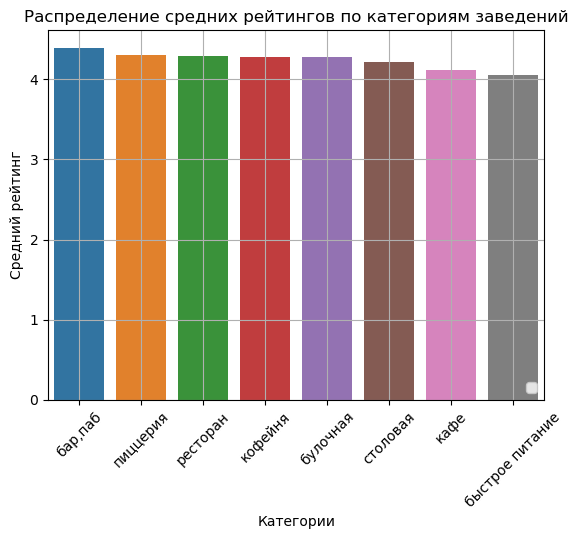

In [25]:
#создаем график
flights = sns.load_dataset('flights')
sns.barplot(x='category', y='rating_mean', data=avg_ratings)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категории')
plt.ylabel('Средний рейтинг')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

По графику и таблице можно заметить, что распределение по среднему рейтингу среди всех категорий практически однородно. 
Наивысший рейтинг у категории "баров и пабов" - 4.39, а на последнем месте находятся заведения категории "быстрого питания" - 4.05.

#### 3.8 Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 

Для этого посчитаем медианный рейтинг заведений для каждого округа:

In [26]:
rating_cafe = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_cafe['rating'] = rating_cafe['rating'].round(2)
rating_cafe = rating_cafe.sort_values(by='rating', ascending=False)
rating_cafe

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


Чтобы отобразить округа на карте, folium нужно передать границы каждой области. Данные об округах Москвы из датасета сохранены в файл admin_level_geomap.geojson. Файл содержит границы областей в виде полигонов — многоугольников, которые задаются вершинами в виде широты и долготы.

In [27]:
#подключаем модуль для работы с JSON-форматом
import json

#пропишем названия пути к файлу
file_read = ['admin_level_geomap.geojson', '/datasets/admin_level_geomap.geojson']

#пропишем функцию для прочтения файла
for file in file_read:
    try:
        with open(file, 'r') as f:
            geo_json = json.load(f)
            print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))
            break  #если файл успешно прочитан, то цикл прерывается
    except:
        pass  #цикл продолжится, если файл не будет успешно прочитан

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

Создадим и выведем на экран фоновую картограмму:

In [28]:
#пропишем две переменные для чтения файла
state_geo = 'admin_level_geomap.geojson'
alternativ_geo = '/datasets/admin_level_geomap.geojson'

#пропишем функцию для прочтения файла
try:
    with open('admin_level_geomap.geojson') as file:
        #прочитать файл state_geo, если он найден
        state_geo = 'admin_level_geomap.geojson'
except FileNotFoundError:
    #если файл не найден, то прочитать alternativ_geo
    state_geo = alternativ_geo

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cafe,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по округам',
).add_to(m)

# выводим карту
m

Таким образом, сейчас на карте у нас отображены все административные округа города Москвы, встречающиеся в нашем датасете, а так же медианные рейтинги заведений по округам.

Центральный административный округ имеет наивысший медианный рейтинг, так же он отмечен самым ярким цветом на карте Москвы.

#### 3.9 Отображение заведений на карте Москвы

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [29]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

При увеличении масштаба кластеры автоматически перегруппировываются и появляются отдельные маркеры с заведениями.

#### 3.10 Топ-15 улиц по количеству заведений

Найдем топ-15 улиц по количеству заведений и построим график распределения количества заведений и их категорий по этим улицам. 

Для начала сгруппируем данные по улицам, категориям и количеству заведений на каждой улице и в каждой категории, сохраним данные в таблице group_street_total.

In [30]:
#сгруппируем данные по улице и категории, посчитаем количество заведений в каждой категории на каждой улице
group_street = data.groupby(['street', 'category']).size().reset_index(name='category_count')

#посчитаем количество заведений на каждой улице
street_count = data.groupby('street').size().reset_index(name='street_count')

#объединим данные о количестве заведений в каждой категории на каждой улице
group_street_total = pd.merge(group_street, street_count, on='street')

#остортируем данные по количеству заведений на улице по убыванию
group_street_total = group_street_total.sort_values(by='street_count', ascending=False)

#выведим таблицу на экран
group_street_total.head()

,street,category,category_count,street_count
2138,проспект мира,кофейня,36,183
2135,проспект мира,булочная,4,183
2136,проспект мира,быстрое питание,21,183
2134,проспект мира,"бар,паб",11,183
2137,проспект мира,кафе,53,183


Теперь найдем перавые 15 уникальных улиц в предыдущей таблице:

In [31]:
#выведим 15 уникальных улиц на экран, удалив дубликаты в street_count:
unique_street_count = group_street_total.drop_duplicates(subset='street_count').head(15)
unique_street_count.head()

,street,category,category_count,street_count
2138,проспект мира,кофейня,36,183
2146,профсоюзная улица,"бар,паб",6,122
2121,проспект вернадского,быстрое питание,12,108
1307,ленинский проспект,"бар,паб",10,107
1291,ленинградский проспект,"бар,паб",15,95


С помощью метода isin() отфильтруем первую таблицу group_street_total и оставим в ней только те улицы, которые присутствуют во второй таблице unique_street_count:

In [32]:
#С помощью метода isin() отфильтруем первую таблицу по улицам из второй таблицы
filtered_group_street_total = group_street_total[group_street_total['street_count'].isin(unique_street_count['street_count'])]

#выведим итоговую таблицу на экран
filtered_group_street_total.head()

,street,category,category_count,street_count
2138,проспект мира,кофейня,36,183
2135,проспект мира,булочная,4,183
2136,проспект мира,быстрое питание,21,183
2134,проспект мира,"бар,паб",11,183
2137,проспект мира,кафе,53,183


Теперь приступим к созданию графика распределения количества заведений и их категорий по этим улицам.

In [33]:
# Создание графика
fig = px.bar(filtered_group_street_total, # загружаем данные
             x='street', # указываем столбец с данными для оси X
             y='category_count', # указываем столбец с данными для оси y
             color='category')  # обозначаем категорию для разделения цветом
fig.update_layout(title='Топ-15 улиц по количеству заведений',
                  xaxis_title='Название улиц',
                  yaxis_title='Количество заведений',
                  height=700, # устанавливим высоту графика 
                  width=900, # устанавливим ширину графика 
                  xaxis={'categoryorder': 'total descending'}) # отсортируем данные по убыванию

fig.show()

Улица Проспект Мира лидирует и неудивительно, ведь она является самым длинным проспектом в Москве, на ее территории расположено 53 кафе, 45 ресторанов, 36 кофеен, 21 заведений быстрого питания, 12 пабов и баров, 4 былочные и 2 столовые.
Далее идет самая длинная улица в Москве - Профсоюзная и проспект Вернадского.

#### 3.11 Улицы с одиночными объектами

Теперь найдем улицы, на которой находится только один объект общепита. 
Для этого сгруппируем названия улиц и оставим только одиночные заведения на улице.

In [34]:
#сгруппируем данные по улице и посчитаем количество заведений на каждой улице
counts_streets = data['street'].value_counts().reset_index()

#переименуем столбцы для удобства
counts_streets.columns = ['street', 'count']

#оставим только улицы с одним заведением
counts_streets = counts_streets[counts_streets['count'] == 1]

#присоединим названия заведений из датафрейма data
counts_street_1 = counts_streets.merge(data[['street', 'name', 'lat', 'lng']], on='street')

print("Количество уникальных заведений:", counts_street_1['name'].nunique())
counts_street_1.head(10)

Количество уникальных заведений: 403


,street,count,name,lat,lng
0,талдомская улица,1,шах-даг,55.873123,37.520527
1,улица фотиевой,1,кафе,55.701889,37.561508
2,2-й верхний михайловский проезд,1,le круассан,55.708626,37.602688
3,3-й михалковский переулок,1,грузинская лавка,55.835572,37.526404
4,малая тульская улица,1,чайхана зейтун,55.700980,37.616678
5,2-й рощинский проезд,1,spoon&dagger,55.706436,37.603206
6,парк дружбы,1,фастфуд,55.853738,37.480208
7,улица губкина,1,шале-микс,55.695321,37.562818
8,воробьёвская набережная,1,prawns,55.711884,37.546112
9,андреевский пешеходный мост,1,кафе пляж,55.724308,37.592890


Итак, из полученной таблицы и количества уникальных значений, можно сказать, что на данных улицах находятся локальные заведения, которые не являются сетью или франшизой.

In [35]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['count']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
counts_street_1.apply(create_clusters, axis=1)

# выводим карту
m

Визуализация показала, что больше всего одиночных заведений находится в центре, на севере и западе столицы.

#### 3.12 Средний чек заведений

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района, а так же построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

Для начала сгруппируем данные по округам и посчитаем для каждого округа медиану среднего чека.

In [36]:
#сгруппируем данные по району и посчитаем медиану среднего чека
median_bill = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')

#отсортируем данные по убыванию
median_bill = median_bill.sort_values(by='middle_avg_bill', ascending=False)

#выведим таблицу на экран
median_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


По полученной таблице уже видно, что по среднему чеку лидируют два округа: ЗАО и ЦАО, построим фоновую картограмму (хороплет) для наглядности.

In [37]:
#пропишем две переменные для чтения файла
state_geo = 'admin_level_geomap.geojson'
alternativ_geo = '/datasets/admin_level_geomap.geojson'

#пропишем функцию для прочтения файла
try:
    with open('admin_level_geomap.geojson') as file:
        #прочитать файл state_geo, если он найден
        state_geo = 'admin_level_geomap.geojson'
except FileNotFoundError:
    #если файл не найден, то прочитать alternativ_geo
    state_geo = alternativ_geo


# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг среднего чека',
).add_to(m)

# выводим карту
m

Итак, в **топе лидиров** по самому дорогому медианному среднему чеку в 1000 руб. находятся **Западный административный округ** и **Центральный административный округ**, но это не удивительно, так как эти округа являются самыми престижными и дорогими округами Москвы, поэтому и средний чек в заведениях здесь намного выше. 

Далее можно отметить, что округа, находящиеся вблизи к ЗАО и ЦАО оновременно идут после лидиров рейтинга, это Северо-Западный административный округ, Северный административный округ и Юго-Западный административный округ, их медианный средний чек колеблится от 600 до 700 руб.

И чем дальше от районов, перечисленных выше, тем медианный средний чек начинает падать с 575 руб. до 450 руб.


#### 3.13 Взаимосвязь графика работы заведений и их зависимость от расположения

Проанализируем взаимосвязь графика работы заведений и зависимость от расположения. 
Для этого сгруппируем данные по округу Москвы и графику работы заведения, далее посчитаем количество таких заведений в датасете.

In [38]:
#сгруппируем данные по улице и категории, посчитаем количество заведений в каждой категории на каждой улице
group_hours = data.groupby(['district', 'is_24/7']).size().reset_index(name='hours_count')
group_hours

,district,is_24/7,hours_count
0,Восточный административный округ,другое,701
1,Восточный административный округ,ежедневно и круглосуточно,97
2,Западный административный округ,другое,778
3,Западный административный округ,ежедневно и круглосуточно,72
4,Северный административный округ,другое,827
5,Северный административный округ,ежедневно и круглосуточно,71
6,Северо-Восточный административный округ,другое,815
7,Северо-Восточный административный округ,ежедневно и круглосуточно,75
8,Северо-Западный административный округ,другое,366
9,Северо-Западный административный округ,ежедневно и круглосуточно,43


Теперь проиллюстрируем полученные значения: 

In [39]:
# Создание графика
fig = px.bar(group_hours, # загружаем данные
             x='district', # указываем столбец с данными для оси X
             y='hours_count', # указываем столбец с данными для оси y
             color='is_24/7')  # обозначаем категорию для разделения цветом
fig.update_layout(title='Взаимосвязь графика работы заведения и их зависимость от расположения',
                  xaxis_title='Административный округ',
                  yaxis_title='Количество заведений',
                  height=700, # устанавливим высоту графика 
                  width=900, # устанавливим ширину графика 
                  xaxis={'categoryorder': 'total descending'}) # отсортируем данные по убыванию

fig.show()

На графике видно, что по количеству заведений, которые работают ежедневно и круглосуточно(131 заведение), а так же имеют другой график работы(2111 заведений) лидирует по прежнему Центральный административный округ, центр притяжения всех жителей столицы.

Если рассматривать второе и третье место среди заведений, работающих круглосуточно и без выходных, то это:
- Восточный административный округ - 97 заведений
- Юго-Восточный административный округ - 93 заведения.
Скорее всего близость с крупными железнодородными вокзалами сказалась на круглосуточной работе заведений.

#### 3.15 Общие выводы третьего шага

Итак, на этапе третьего шага была проделана большая работа по анализу данных, вот что мы сделали:

**1. Проанализировали категории заведений.**

Выяснили, что заведения распределены по категорям неравномерно, больше всего заведений у категории *"кафе"* - 2378 заведений, далее идут *"рестораны"* - 2043 заведений и *"кофейни"* - 1413 заведений. 


**2. Посчитали среднее количество посадочных мест в каждой категории:**
- больше всего посадочных мест в *барах и пабах* - 125 
- далее идут *рестораны* - 122 мест и *кофейни* - 112 мест.

**3. Посчитали соотношение сетевых и несетевых заведений:**
- *сетевые заведения* -  38.1%
- *несетевын заведения* - 61.9%.

**4. Проанализировали соотношение сетевых заведений:**
- "булочная" - 61.33%
- "пиццерия" - 52.13% 
- "кофейни" - 50.96%. 

**5. Выявили самые популярные сетевые заведения**
- *кофейня Шоколадница* - 119 заведений
- *пиццерия Домино'с Пицца* - 76 заведений
- *пиццерия Додо Пицца* - 74 заведения

Так же отметили, что это действительно популярные сети, встречающие в каждом районе, а так же у них есть объединящий признак - они все работают по франшизе.

**6. Проанализировали, в каких округах больше всего заведений и каких категорий:**
- лидирует *Центральный административный округ*, самая популярная категория - это рестораны (670 заведений), далее идут кафе (464 заведений) и кофейни (428 заведений)
- второе место  - *Северный административный округ*
- третье место  - *Южный административный округ*.

**7. Проанализировали распределение средних рейтингов по категориям заведений**
Распределение в данные практически равномерное, наивысший рейтинг у категории *"баров и пабов"* - 4.39, а на последнем месте находятся заведения категории *"быстрого питания"* - 4.05.

**8 Построили фоновую  картограмму (хороплет) со средним рейтингом заведений каждого района**
и выяснили, что *Центральный административный округ* имеет наивысший медианный рейтинг, так же он отмечен самым ярким цветом на карте Москвы.

**9. Отобразили заведения датасета на карте Москвы**

**10. Определили топовые улицы по количеству заведений:**
- *Улица Проспект Мира*
- *Профсоюзная улица*
- *проспект Вернадского.*

**11. Определили, в каком округе самый высокий средний чек:**

- *Западный административный округ*
- *Центральный административный округ*

**12. Проанализировали заимосвязь графика работы заведений и их зависимость от расположения:**
- первое место среди круглосуточных заведений занял *Центральный административный округ* с 131 заведениями,
- второе место у *Восточного административного округа* - 97 заведений
- третье место *Юго-Восточного административного округа* - 93 заведения.

**Подводя итог**, можно сказать, что самым перспективным округом для открытия нового заведения является *Центральный административный округ*, так как это самое посещаемое место, а так же средний чек здесь самый высокий, но стоит отметить так же и высокий уровень конкуренции в данном округе, так как именно здесь самое большое скопление заведений по количесву, а так же среднему рейтингу заведений. 

Так же можно присмотреться к Западному административному округу и Северному административному округу, так как здесь так же хороший средний чек и находятся улицы с большой проходимостью людей.

Среди привлекательных категорий для открытия можно выделить рестораны и кофейни, так как для этих заведений не требуется большого количества посадочных мест и можно взять уже готовую франшизу, но стоит так же отметить большую конкуренцию.

### Шаг 4. Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» принято решение открыть кофейню в Москве. Проанализируем рынок кофеен в Москве.

#### 4.1 Количество кофеен в датасете

Посчитаем, сколько всего кофеен в датасете, для этого проведем расчет всех кофеен, не только уникальных, так как есть сетевые заведения с франшизами, а они тоже конкурируют между собой.

Для начала отфильтруем наш датасет и выведем на экран строки только по кофейням, сохраним результат в новый датафрем data_coffee и будем работать дальше с ним.

In [40]:
data_coffee = data[data['category'] == 'кофейня']
data_coffee.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,другое
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,другое
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,другое
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,другое
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,другое


In [41]:
print('Количество кофеен в датасете:', data_coffee['name'].count())

Количество кофеен в датасете: 1413


Итак, всего в датасете представлено 1413 кофеен по Москве.

#### 4.2 Количество кофеен по районам Москвы

Теперь определим, в каких районах больше всего кофеен и почему. 

In [42]:
# сгруппируем данные по округам и посчитаем количество кофеен
district_coffee = data_coffee.groupby('district')['name'].count().reset_index(name='name_count')

#отсортируем данные по убыванию
district_coffee = district_coffee.sort_values(by='name_count', ascending=False)

#выведим таблицу на экран
district_coffee

,district,name_count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


Теперь визуализируем распределение количества кофеен по округам города Москвы.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


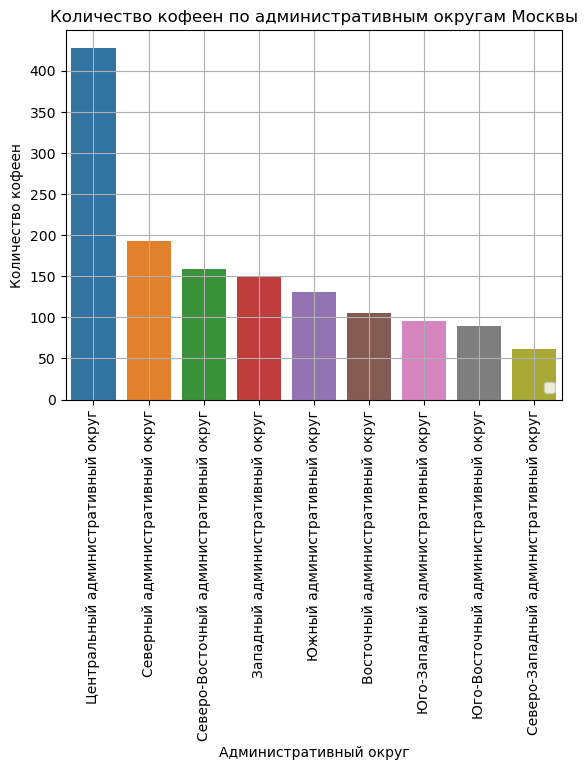

In [43]:
#создаем график
flights = sns.load_dataset('flights')
sns.barplot(x='district', y='name_count', data=district_coffee)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество кофеен по административным округам Москвы')
plt.xlabel('Административный округ')
plt.ylabel('Количество кофеен')
# поворачиваем подписи значений по оси X на 90 градусов
plt.xticks(rotation=90)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Итак, по графику видно, что есть лидер среди количества кофеен - это Центральный административный округ  с количеством кофеен - 428. 
Далее с большим отрывом идуи Северный и Северо-Восточный административные округа.

Теперь построим фоновую картограмму (хороплет) для наглядности по количеству кофеен на карте Москвы.

In [44]:
#пропишем две переменные для чтения файла
state_geo = 'admin_level_geomap.geojson'
alternativ_geo = '/datasets/admin_level_geomap.geojson'

#пропишем функцию для прочтения файла
try:
    with open('admin_level_geomap.geojson') as file:
        #прочитать файл state_geo, если он найден
        state_geo = 'admin_level_geomap.geojson'
except FileNotFoundError:
    #если файл не найден, то прочитать alternativ_geo
    state_geo = alternativ_geo

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_coffee,
    columns=['district', 'name_count'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Количество кофеен',
).add_to(m)

# выводим карту
m

По карте видно, что самый яркий цвет у ЦАО, это самый проходимый и популярный округ в Москве, поэтому именно здесь больше концентрация кофеен. 

Менее яркие цвета у Северного, Северо-Восточного, Западного и Южного административных округов. В данных округах диапазон количества кофеен числится от 131 до 193 заведений, что тоже достаточно много. В этих округах много парков для прогулок с кофе, а так же офисов и университетов, студенты и офисные работники так же могут заглянуть в кофейню за чашечкой кофе утром или в обед. 

В остальных округах есть лесопарки, в которых нет никаких заведений и промышленные зоны, поэтому это не самые привлекательные районы для открытия кофейни.

#### 4.3 Режим работы кофеен

Выясним, есть ли круглосуточные кофейни, и где они расположены. 

Для этого отсортируем датафрем по круглосуточным кофеням, сгруппируем заведения по округам и посчитаем их количество. 

In [45]:
#отфильтруем кофейни по круглосуточной работе заведения
data_coffee_24 = data_coffee[data_coffee['is_24/7'] == 'ежедневно и круглосуточно']

#сгруппируем данные по округам и посчитаем количество кофеен
district_coffee_24 = data_coffee_24.groupby('district')['name'].count().reset_index(name='name_count')

#отсортируем данные по убыванию
district_coffee_24 = district_coffee_24.sort_values(by='name_count', ascending=False)

#выведим таблицу на экран
district_coffee_24

,district,name_count
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


По таблице выше можно заметить, что действительно среди кофеен есть заведения с круглосуточным режимом работы, выделим топ-3 округа по количеству таких заведений: 
- Центральный административный округ - 26
- Западный административный округ- 9
- Юго-Западный административный округ - 7

Теперь отобразим название кофеен на карте Москвы.

In [46]:
#добавим кластеры на карту Москвы
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffee_24.apply(create_clusters, axis=1)

# выводим карту
m

Итак, теперь можно сделать вывод, что большинство круглосуточных кофеен расположены на Садовом кольце, Третьем транспортном кольце и МКАД. 

Например, это Wild Bean Cafe, которые в основном находятся на автозаправках, а так же One Price Coffee и Cofix, которые находятся на железнорожных вокзалах (например, Казанский вокзал).

Кофейня Шоколадница так же расположена вблизи железножорожных вокзалах и станций метро.

Так же больше всего круглосуточных кофеен расположены внутри Садового кольца в самом центре столицы.

#### 4.4 Рейтинг кофеен

Проанализируем рейтинг кофеен по округам города Москвы, а так же построим карту распределения среднего рейтинга по городу.

Для этого сгруппируем данные по административным округам и посчитаем средний рейтинг заведений.

In [47]:
#сгруппируем данные по округам и посчитаем средний рейтинг
avg_ratings_coffee = data_coffee.groupby('district')['rating'].mean().reset_index()

#переименуем столбцы для удобства
avg_ratings_coffee.columns = ['district', 'rating_mean']

#отсортируем данные по убыванию
avg_ratings_coffee = avg_ratings_coffee.sort_values(by='rating_mean', ascending=False)

#округлим значения до двух знаков после запятой
avg_ratings_coffee['rating_mean'] = avg_ratings_coffee['rating_mean'].round(2)

#выведим таблицу на экран
avg_ratings_coffee

,district,rating_mean
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
0,Восточный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


Для нагладности составим график по полученной таблице:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


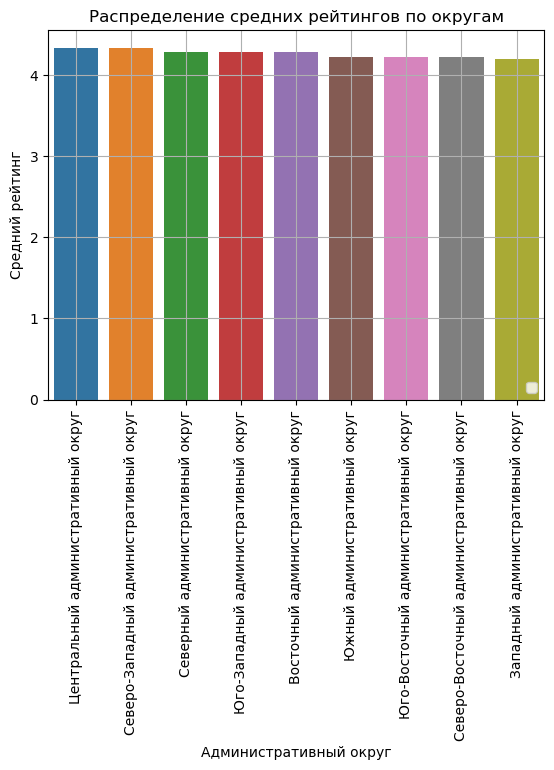

In [48]:
#создаем график
flights = sns.load_dataset('flights')
sns.barplot(x='district', y='rating_mean', data=avg_ratings_coffee)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение средних рейтингов по округам')
plt.xlabel('Административный округ')
plt.ylabel('Средний рейтинг')
# поворачиваем подписи значений по оси X на 90 градусов
plt.xticks(rotation=90)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Как можем заветить, распределение среднего рейтинга по округам довольно плавное, выделим топ-3 округа с наивысшим рейтингом: 
1. Центральный административный округ - 4.34
2. Северо-Западный административный округ - 4.33
3. Северный административный округ - 4.29

Как и в распределении среднего рейтинга заведений всех категорий, так и в категории только кофеен, в топ-3 выходят одни и те же административные округи Москвы.

#### 4.5 Стоимость чаши капучино

Определим, нна какую стоимость чашки капучино стоит ориентироваться при открытии и почему. 

Значения средних чеков заведений хранятся в столбце middle_coffee_cup. Посчитаем медиану этого столбца для каждого района, а так же построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

Для начала сгруппируем данные по округам и посчитаем для каждого округа медиану среднего чека.

In [49]:
# сгруппируем данные по району и посчитаем медиану среднего чека
median_bill_cup = data.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')

#отсортируем данные по убыванию
median_bill_cup = median_bill_cup.sort_values(by='middle_coffee_cup', ascending=False)

#выведим таблицу на экран
median_bill_cup

,district,middle_coffee_cup
7,Юго-Западный административный округ,197.0
5,Центральный административный округ,190.0
1,Западный административный округ,187.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
4,Северо-Западный административный округ,150.0
8,Южный административный округ,149.5
6,Юго-Восточный административный округ,145.0
0,Восточный административный округ,135.0


Построим график для наглядности.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


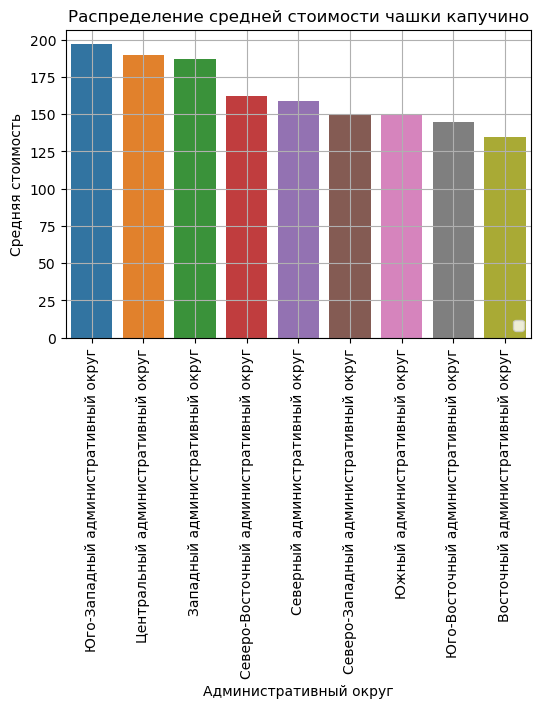

In [50]:
#создаем график
plt.figure(figsize=(6, 4)) 
flights = sns.load_dataset('flights')
sns.barplot(x='district', y='middle_coffee_cup', data=median_bill_cup)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение средней стоимости чашки капучино')
plt.xlabel('Административный округ')
plt.ylabel('Средняя стоимость')
# поворачиваем подписи значений по оси X на 90 градусов
plt.xticks(rotation=90)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

#### По полученной таблице уже видно, что по среднему чеку лидируют три округа: 
- Юго-Западный административный округ - 197
- Центральный административный округ - 190
- Западный административный округ - 187


Построим фоновую картограмму (хороплет) для наглядности.

In [51]:
#пропишем две переменные для чтения файла
state_geo = 'admin_level_geomap.geojson'
alternativ_geo = '/datasets/admin_level_geomap.geojson'

#пропишем функцию для прочтения файла
try:
    with open('admin_level_geomap.geojson') as file:
        #прочитать файл state_geo, если он найден
        state_geo = 'admin_level_geomap.geojson'
except FileNotFoundError:
    #если файл не найден, то прочитать alternativ_geo
    state_geo = alternativ_geo
    
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг стоимости одной чашки капучино в рублях',
).add_to(m)

# выводим карту
m

На карте три района с наибольшей стоимостью одной чашки капучино выделены ярким красным цветом, это самые дорогие районы Москвы, поэтому и средний чек на кофе здесь будет выше. 

Если открывать кофейни в этих районах, то чашка кофе капучино должна стоить не дороже 200 руб.

#### 4.6 Рекомендации по открытию новой кофейни

**Расположение**

После проведенного анализа, можно выделить наиболее благоприятный район для открытия кофейни - это **Западный административный округ**, в нем средняя концентрация количества кофеен, поэтому конкуренция будет намного ниже, чем, например, в Центральном округе, где кофени расположены буквально на каждом шаге. 

Так же Западный административный округ примечателен тем, что имеет множество парков на своей территорри и находится в непосредственной близости к **популярным достопримечательностям Москвы:** 
- Филевский парк
- Парк победы
- МГУ 
- Киевский вокзал
- Лужники
- Воробьевы горы

Изобразим мх на карте ниже для наглядности:

In [52]:
# сохраняем координаты Филевского парка в переменные
filyovsky_park_lat, filyovsky_park_lng = 55.7419, 37.4833
# сохраняем координаты Парка победы в переменные
park_pobedy_lat, park_pobedy_lng = 55.7365, 37.5163
# сохраняем координаты МГУ в переменные
msu_lat, msu_lng = 55.7029, 37.5307
# сохраняем координаты Киевского вокзала в переменные
kievsky_vokzal_lat, kievsky_vokzal_lng = 55.7435, 37.5660
# сохраняем координаты Лужников в переменные
luzhniki_lat, luzhniki_lng = 55.7157, 37.5536
# сохраняем координаты Воробьевых гор в переменные
vorobyovy_gory_lat, vorobyovy_gory_lng = 55.7100, 37.5336

# создаём карту с центром в точке расположения Филевского парка и начальным зумом 12
m = folium.Map(location=[filyovsky_park_lat, filyovsky_park_lng], zoom_start=12, tiles='Cartodb Positron')

# создаём маркеры для разных мест и добавляем на карту
places = [
    {"name": "Филевский парк", "lat": filyovsky_park_lat, "lng": filyovsky_park_lng},
    {"name": "Парк Победы", "lat": park_pobedy_lat, "lng": park_pobedy_lng},
    {"name": "МГУ", "lat": msu_lat, "lng": msu_lng},
    {"name": "Киевский вокзал", "lat": kievsky_vokzal_lat, "lng": kievsky_vokzal_lng},
    {"name": "Лужники", "lat": luzhniki_lat, "lng": luzhniki_lng},
    {"name": "Воробьёвы горы", "lat": vorobyovy_gory_lat, "lng": vorobyovy_gory_lng}
]

#пропишем функцию
for place in places:
    folium.Marker([place["lat"], place["lng"]],
                  tooltip="ЗАО",
                  popup=place["name"]).add_to(m)

# выводим карту
m

Эти достопримечательногсти являются одним из главных центров притяжения москвичей, поэтому проходимость в данном районе очень большая. Так же в этом округе расположено большое количество университетов и офисов. 

**Режим работы кофейни**

В Западном административном округе 9 кофеен, которые работают круглосуточно, большинство из них - это кофейни, расположенные на заправочных станциях. 

Наибольший поток людей, учитывая специфику района, будут посещать кофейню утром перед работой или учебой, в обед и вечером. Поэтому наиболее подходящий график работу - ежедневно, с 7-30 утра до 22 вечера.

**Рейтинг кофеен**

Самый низкий рейтинг кофеен в Западном административном округе, поэтому при правильной рекламной кампании, качественном дизайне, сервисе и главное качестве кофе в новом заведении, можно получить одобрение среди местных жителей и не только, высокий рейтинг и хорошую прибыль.


**Стоимость чаши капучино**

Средняя стоимость чашки капучино в ЗАО - 187 руб. Для первого времени работы кофейни рекомендуется выставить 170 руб. за чашку капучино, чтобы было приемущество среди конкурентов.


Проведенный анализ и рекомендации выше помогут при открытии кофейни, и сделают дальнейший бизнес успешным.

### Шаг 5. Общие выводы

Итак, подведем **итоги** всех шагов нашего исследования.

**На этапе первого шага** были выгружены все нужные для работы библиотеки, а так же мы выяснили, что нет явных и неявных дубликатов и проанализировали типы данных каждого столбца и наличие пустых строк.

**Во втором шаге** была проведена предобработка данных, мы приняли решение оставить пропуски в данных, а так же создали два новых столбца 'street' с названием улиц и 'is_24/7' с графиком работы заведений.

**На этапе третьего шага** мы провели анализ данных, а именно:

1. **Проанализировали категории заведений** и выяснили, что больше всего заведений у категории *"кафе"* - 2378, *"рестораны"* - 2043 и *"кофейни"* - 1413 заведений. 

2. **Посчитали среднее количество посадочных мест** в каждой категории и выяснили, что больше всего в *барах и пабах* - 125, далее идут *рестораны* - 122 мест и *кофейни* - 112 мест.

3. **Посчитали соотношение сетевых и несетевых заведений:**
- *сетевые заведения* -  38.1%
- *несетевын заведения* - 61.9%.

4. **Выявили самые популярные сетевые заведения:**
- *кофейня Шоколадница* - 119 заведений
- *пиццерия Домино'с Пицца* - 76 заведений
- *пиццерия Додо Пицца* - 74 заведения

5. **Проанализировали, в каких округах больше всего заведений и выделили топ-3:**
- *Центральный административный округ* - 2242
- *Северный административный округ* - 900
- *Южный административный округ* - 892

6. **Выявили округ с самым высоким средним рейтингом заведений** - это*Центральный административный округ* 

7. **Определили топовые улицы по количеству заведений:**
- *Улица Проспект Мира*
- *Профсоюзная улица*
- *проспект Вернадского.*

8. **Определили**, что **самый высокий чек** в *Западном* и *Центральном административных округах*

9. **Выявили топ-3 округа по количеству круглосуточных заведений:**
- *Центральный административный округ*  - 131 
- *Восточный административный округ* - 97 
- *Юго-Восточный административный округ* - 93 

10. **Дали рекомендации по открытию нового заведения в Москве:**
- самым перспективным округом для открытия нового заведения является *Центральный административный округ*, так как это самое посещаемое место в Москве с высоким средним чеком, но и с самой большой конкуренцией среди заведений
- стоит присмотреть так же к Западному административному округу и Северному административному округу, так как здесь так же хороший средний чек и находятся улицы с большой проходимостью людей.
- среди привлекательных категорий для открытия можно выделить рестораны и кофейни, так как для этих заведений не требуется большого количества посадочных мест и можно взять уже готовую франшизу.


**В четвертом шаге** был проведен **анализ рынка кофеен** в датасете, а так же даны **рекомендации по открытию новой кофейни в Москве**. 

**1. Результаты анализа рынка кофеен**

**количество кофеен по районам Москвы:**
- Центральный административный округ - 428
- Северный административный округ - 193
- Северо-Восточный административный округ - 159

**количество круглосуточных кофеен:**
- Центральный административный округ - 26
- Западный административный округ- 9
- Юго-Западный административный округ - 7

Большинство круглосуточных кофеен расположены на Садовом кольце, Третьем транспортном кольце и МКАД. 

**средний рейтинг кофеен:**
- Центральный административный округ - 4.34
- Северо-Западный административный округ - 4.33
- Северный административный округ - 4.29

**стоимость чаши капучино:**
- Юго-Западный административный округ - 197
- Центральный административный округ - 190
- Западный административный округ - 187

**2. Рекомендации по открытию новой кофейни.**

**Расположение**
Рекомундуется открыть новую кофейню в **Западном административном округе**,так как в нем средняя концентрация количества кофеен, поэтому конкуренция будет намного ниже. Так же здесь расположены популярные достопримечательности Москвы, парки, крупные университеты и бизнес центры.

**Режим работы кофейни**
Наибольший поток людей, учитывая специфику района, будут посещать кофейню утром перед работой или учебой, в обед и вечером. Поэтому *наиболее подходящий график работу - ежедневно, с 7-30 утра до 22 вечера.*

**Рейтинг кофеен**
Самый низкий рейтинг кофеен в Западном административном округе, поэтому при правильной рекламной кампании, качественном дизайне, сервисе и главное качестве кофе в новом заведении, можно получить одобрение среди местных жителей и не только, *высокий рейтинг* и хорошую прибыль.


**Стоимость чаши капучино**
Для первого времени работы кофейни рекомендуется выставить 170 руб. за одну чашку капучино, чтобы было преимущество среди конкурентов.

Проведенный анализ и рекомендации выше помогут ннвесторам из фонда «Shut Up and Take My Money» успешно вложить деньги в открытие кофейни в Москве.

Так же для удобства работы с полученными данными подготовлена презентация: <https://docs.google.com/presentation/d/1ZqdWqELs7UhhJt7lhlqazULHOGRI9rBH8YfKEXu-6BA/edit#slide=id.p>